# Class 15: Interactive Data visualizations

Plan for today:
- Visualizing data with heatmaps
- Creating maps
- If there is time: for loops


In [123]:
import YData

# YData.download.download_class_code(15)   # get class code    
# YData.download.download_class_code(15, True)  # get the code with the answers 
# YData.download_homework(6)  # get homework 6

YData.download_data("dennys.csv")

YData.download.download_data("States_shapefile.geojson")
YData.download.download_data("state_demographics.csv")
YData.download.download_data("ne_110m_graticules_10.prj")
YData.download.download_data("ne_110m_graticules_10.shp")
YData.download.download_data("ne_110m_graticules_10.shx")
YData.download.download_data("ne_110m_graticules_10.dbf")

YData.download_data('daily_bike_totals.csv')


The file `dennys.csv` already exists.
If you would like to download a new copy of the file, please rename the existing copy of the file.
The file `States_shapefile.geojson` already exists.
If you would like to download a new copy of the file, please rename the existing copy of the file.
The file `state_demographics.csv` already exists.
If you would like to download a new copy of the file, please rename the existing copy of the file.
The file `ne_110m_graticules_10.prj` already exists.
If you would like to download a new copy of the file, please rename the existing copy of the file.
The file `ne_110m_graticules_10.shp` already exists.
If you would like to download a new copy of the file, please rename the existing copy of the file.
The file `ne_110m_graticules_10.shx` already exists.
If you would like to download a new copy of the file, please rename the existing copy of the file.
The file `ne_110m_graticules_10.dbf` already exists.
If you would like to download a new copy of the file, 

If you are using colabs, you should install the YData packages by uncommenting and running the code below and run the code below to mount the your google drive.

In [124]:
## If you are using Google Colabs, you should install the YData packages and mount the your google drive by uncommenting and running the code below.

# !pip install https://github.com/emeyers/YData_package/tarball/master
# from google.colab import drive
# drive.mount('/content/drive')

In [125]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px

import matplotlib.pyplot as plt
%matplotlib inline

## Pivot tables and heatmaps

Heatmaps allow us to view data that is a function of two variables. 

In order to create a heatmap, we first need first transformat out data into a DataFrame that has appropirate rows and columns. One way we can do this is to use the pandas `.pivot_table(index = , columns = , values = , aggfunc = )` method, where the arguments to this method are:

- `index`: The variable we want in the rows of out DataFrame
- `columns`: The variable we want in the columns of our DataFrame
- `values`: The values we want to be in the DataFrame
- `aggfunc`: The function we will use to aggregate our data 

Let's apply the `.pivot_table()` method to our gapmider data to create a DataFrame called `gapminder_continent_wide` where:

- The rows are the different continents
- The columns are the year
- The values in the DataFrame are the average life expectancy (For each continent in each year)


In [126]:
# Generate a pivot table from the gapminder data

gapminder = px.data.gapminder()   # the plotly package comes with the gapminder data

gapminder_continent_wide = gapminder.pivot_table(index = 'continent', 
                                                 columns = 'year', 
                                                 values = 'lifeExp', 
                                                 aggfunc = 'mean')
gapminder_continent_wide.head()

year,1952,1957,1962,1967,1972,1977,1982,1987,1992,1997,2002,2007
continent,,,,,,,,,,,,
Africa,39.135500,41.266346,43.319442,45.334538,47.450942,49.580423,51.592865,53.344788,53.629577,53.598269,53.325231,54.806038
Americas,53.279840,55.960280,58.398760,60.410920,62.394920,64.391560,66.228840,68.090720,69.568360,71.150480,72.422040,73.608120
Asia,46.314394,49.318544,51.563223,54.663640,57.319269,59.610556,62.617939,64.851182,66.537212,68.020515,69.233879,70.728485
Europe,64.408500,66.703067,68.539233,69.737600,70.775033,71.937767,72.806400,73.642167,74.440100,75.505167,76.700600,77.648600
Oceania,69.255000,70.295000,71.085000,71.310000,71.910000,72.855000,74.290000,75.320000,76.945000,78.190000,79.740000,80.719500


Now that we have the appropriate DataFrame, let's use the plotly `imshow()` function to visualize it!

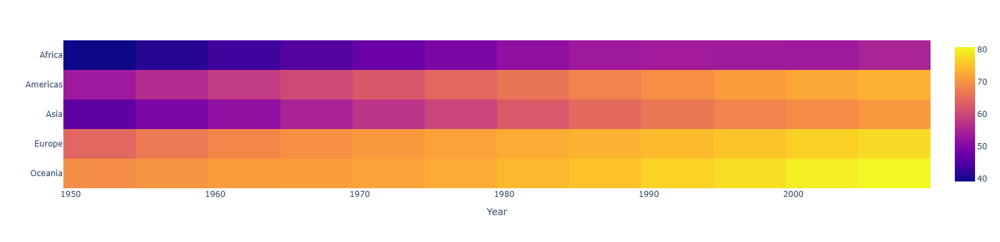

In [127]:
# use plotly imshow() to visualize the pivot table

fig = px.imshow(gapminder_continent_wide)

fig.update_layout(xaxis_title = "Year", yaxis_title = "")

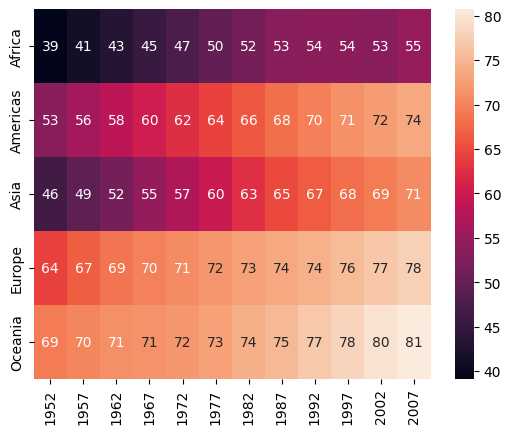

In [128]:
# We can create heatmaps in seaborn as well

ax = sns.heatmap(gapminder_continent_wide, 
                annot=True, 
                fmt=".0f");

ax.set_xlabel("");
ax.set_ylabel("");


## 1. Spatial mapping with geopandas

Visualizing spatial data through maps is another powerful way to see trends in data. There are several mapping packages in Python. Here we will use the geopandas package to create maps. 

The geopandas package defines a geopandas DataFrame, which is the same as a pandas DataFrame but has an additional column called `geometry` which specifies geographic information. 

Let's explore this now!


### Visualizing boundaries

Let's start by looking some geopanda DataFrames and visualizing some geometric boundaries.

Below we load the gapminder data again and get the gapminder data from 2007. We also show which maps come with geopandas. 


In [129]:
import geopandas as gpd


Let's get a geopandas DataFrame that has th countries in the world...

In [130]:
# View the world geopandas DataFrame

url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)


# print the data type
print(type(world))

# look at the first few rows of the data
world.head()

<class 'geopandas.geodataframe.GeoDataFrame'>


,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,...,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Admin-0 country,1,2,Canada,CAN,0,2,Sovereign country,1,Canada,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,Admin-0 country,1,2,United States of America,US1,1,2,Country,1,United States of America,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."


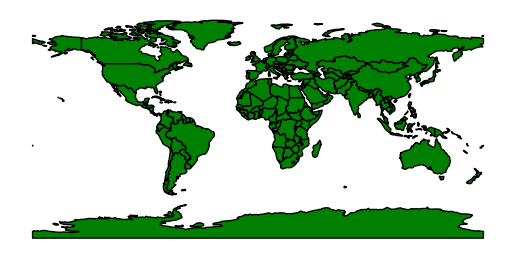

In [131]:
# Plot a world map with particular properties

ax = world.plot(color = "green", edgecolor = "black");

ax.set_axis_off();


In [132]:
# Let's start by getting a map of just the United States

state_map = world.query("SOVEREIGNT == 'United States of America'")

state_map


,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
4,Admin-0 country,1,2,United States of America,US1,1,2,Country,1,United States of America,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
45,Admin-0 country,1,5,United States of America,US1,1,2,Dependency,1,Puerto Rico,...,None,None,None,None,None,None,None,None,None,"POLYGON ((-66.28243 18.51476, -65.7713 18.4266..."


### Coordinate reference systems and projections

A coordinate reference system (CRS) is a framework used to precisely measure locations on the surface of the Earth as coordinates. The goal of any spatial reference system is to create a common reference frame in which locations can be measured precisely and consistently as coordinates, which can then be shared unambiguously, so that any recipient can identify the same location that was originally intended by the originator.

There are two different types of coordinate reference systems: Geographic Coordinate Systems and Projected Coordinate Systems. [Projected coordinate systems](https://en.wikipedia.org/wiki/List_of_map_projections) map 3D coordinates into a 2D plane so they can be plotted. Different projected coordiate systems perserve different properties, such as keeping all angles intact which is usefor for navigation (e.g., the Mercator projection) or keeping the size of land areas intact (e.g., the Eckert IV projection). 

A detailed discussion of CRS is beyond the scope of the class. But for the purposes of this class, it is just important that all layers in a map are using the same project (otherwise, for example, data points representing cities and the underlying spatial map won't line up). 

Let's very briefly explore different map projections... 


In [133]:
# Read Graticules (lines on a map)
graticules = gpd.read_file("ne_110m_graticules_10.shp")
print(graticules.crs)
graticules.head(3)

EPSG:4326


,degrees,direction,display,dd,ScaleRank,geometry
0,80,N,80 N,80.0,6,"LINESTRING (180 79.99848, 179.99664 79.99848, ..."
1,70,N,70 N,70.0,6,"LINESTRING (180 69.99847, 179.99664 69.99847, ..."
2,60,N,60 N,60.0,6,"LINESTRING (180 59.99866, 179.99664 59.99866, ..."


EPSG:4326


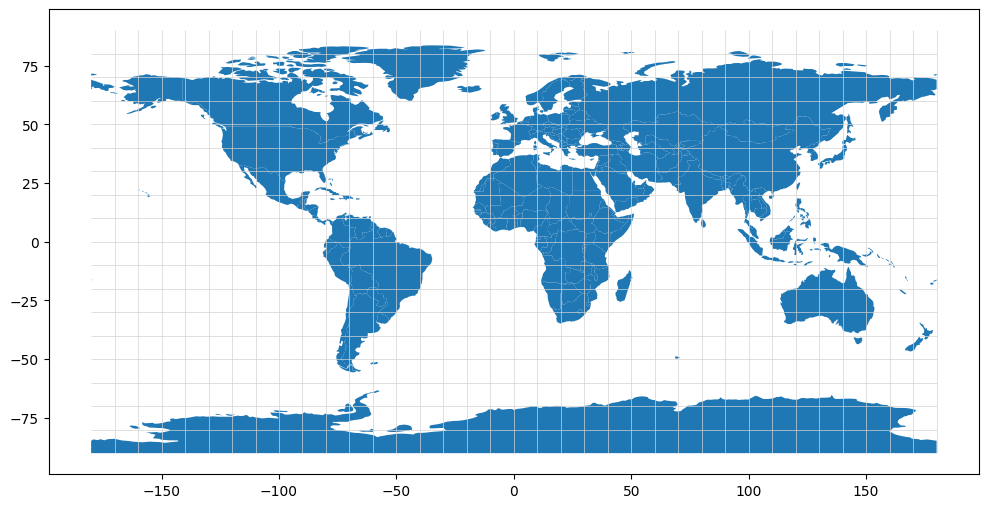

In [134]:
# Web Mercator projection - perserves angles (EPSG:4326 projection)

print(world.crs) # print the default CRS


# plot the map
fig, ax = plt.subplots(figsize=(12,10))
world.plot(ax = ax);
graticules.plot(ax=ax, color="lightgray", linewidth=0.5);

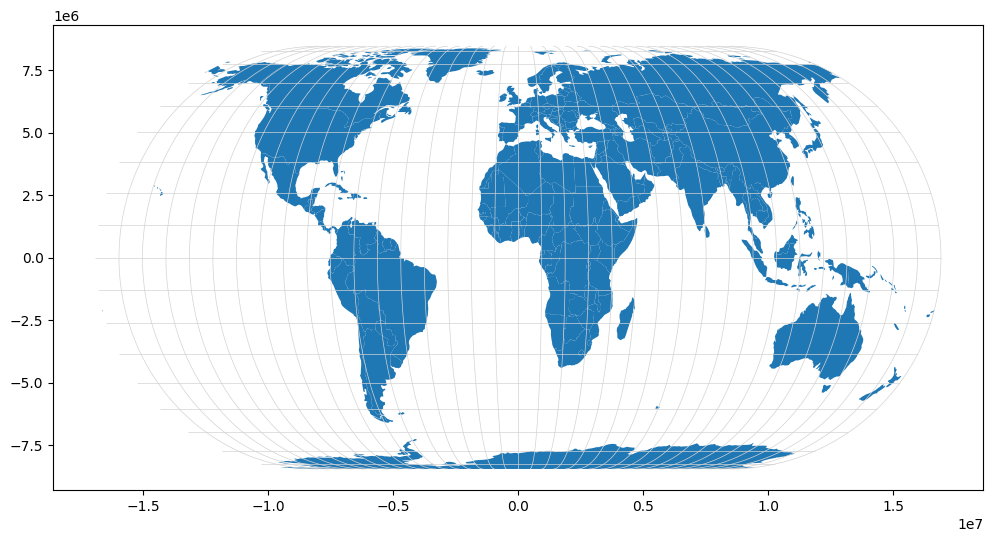

In [135]:
# Eckert IV is an equal-area projection  ("ESRI:54012")

fig, ax = plt.subplots(figsize=(12,10))
world.to_crs("ESRI:54012").plot(ax = ax);
graticules.to_crs("ESRI:54012").plot(ax=ax, color="lightgray", linewidth=0.5);

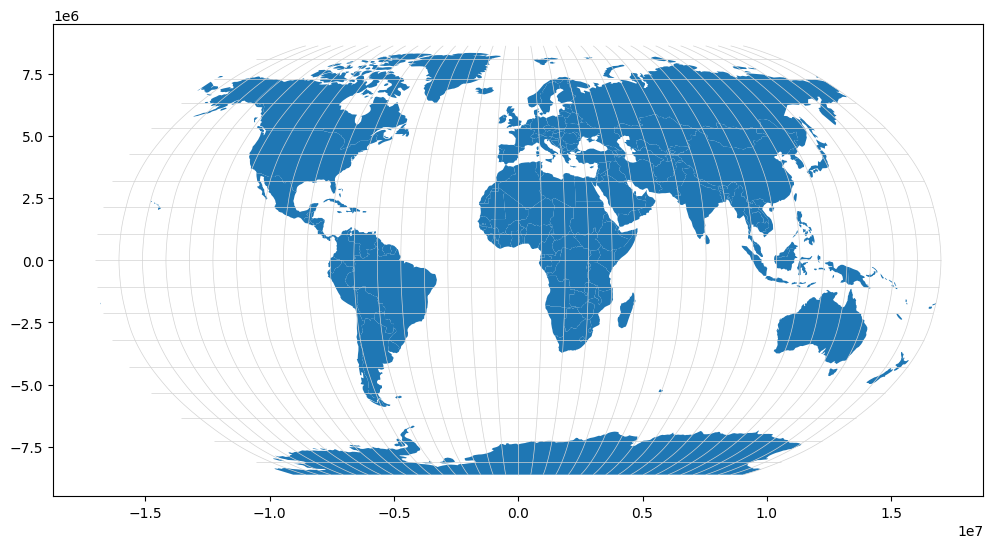

In [136]:
# Robinson projection - neither equal-area nor conformal ("ESRI:54030") 

fig, ax = plt.subplots(figsize=(12,10))
world.to_crs("ESRI:54030").plot(ax = ax);
graticules.to_crs("ESRI:54030").plot(ax=ax, color="lightgray", linewidth=0.5);

To learn more about "What your favorite map projection says about you" see: https://xkcd.com/977/

### Maps with layers and markers

We can also plot points on a map. When doing so, it's important that the points and the underlying map use the same coordinate reference system (CRS).

Let's add Denny's locations to the map of the United States!


In [137]:
# Let's start by getting a map of just the United States

state_map = world.query("SOVEREIGNT == 'United States of America'")

state_map

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
4,Admin-0 country,1,2,United States of America,US1,1,2,Country,1,United States of America,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
45,Admin-0 country,1,5,United States of America,US1,1,2,Dependency,1,Puerto Rico,...,None,None,None,None,None,None,None,None,None,"POLYGON ((-66.28243 18.51476, -65.7713 18.4266..."


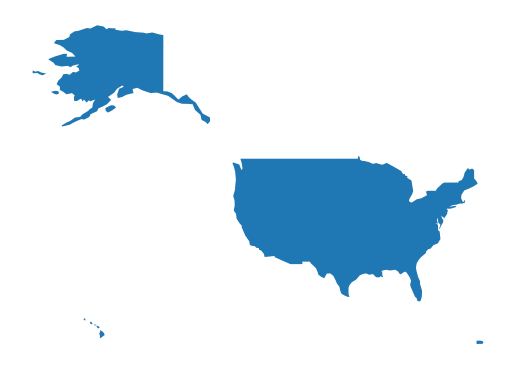

In [138]:
# visualize just the United States

ax = state_map.plot();

ax.set_axis_off();

In [139]:
# Get the coordinate reference system (CRS) for our map

print(state_map.crs)

EPSG:4326


Let's now load our Denny's data!

In [140]:
# Let's load our Denny's data
dennys = pd.read_csv("dennys.csv")
dennys.head(3)

,Unnamed: 0,address,city,state,zip,longitude,latitude
0,1,2900 Denali,Anchorage,AK,99503,-149.8767,61.1953
1,2,3850 Debarr Road,Anchorage,AK,99508,-149.8090,61.2097
2,3,1929 Airport Way,Fairbanks,AK,99701,-147.7600,64.8366


To convert longitude and latitude coordinates into geometric objects; i.e., we will convert them into Shaply objects.  We can use the `gpd.points_from_xy(long, lat)` function. 

In [141]:
# Let's convert our longitude and latitude coordinates into geometric (Shapely) objects 

dennys_geometries = gpd.points_from_xy(dennys["longitude"], dennys["latitude"])
dennys_geometries[0:5]

<GeometryArray>
[<POINT (-149.877 61.195)>,  <POINT (-149.809 61.21)>,
  <POINT (-147.76 64.837)>,  <POINT (-85.468 32.603)>,
  <POINT (-86.832 33.562)>]
Length: 5, dtype: geometry

In [142]:
# Let's now convert out data into a geopandas DataFrame

dennys_gpd = gpd.GeoDataFrame(dennys, geometry=dennys_geometries)
dennys_gpd.head(3)

,Unnamed: 0,address,city,state,zip,longitude,latitude,geometry
0,1,2900 Denali,Anchorage,AK,99503,-149.8767,61.1953,POINT (-149.8767 61.1953)
1,2,3850 Debarr Road,Anchorage,AK,99508,-149.8090,61.2097,POINT (-149.809 61.2097)
2,3,1929 Airport Way,Fairbanks,AK,99701,-147.7600,64.8366,POINT (-147.76 64.8366)


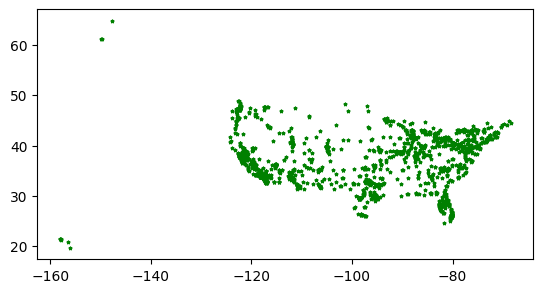

In [143]:
# We can plot the location of the Denny's using the plot function

dennys_gpd.plot(marker='*', color='green', markersize=5);


In [144]:
# Let's check the CRS

print(dennys_gpd.crs)


None


Before plotting data, we should set the appropriate coordinate reference system (CRS). This is partlcularly imporant when we are combining different layers on a map, such as putting city locations on the map that has the outlines of regional borders. 

The CRS that uses longitude and latitude coordinates is the [World Geodetic System 1984 (WGS84)](https://epsg.io/4326). This system is often referred to by its EPSG Geodetic Parameter Dataset code which is `4326`. 

Thus, we should set the set coordinate system to be EPSG 4326. We can do this using the method `.set_crs(4326)`. Let's set this on our `dennys_gpd` DataFrame. 


In [145]:
# Let's set the CRS to match the CRS of our map (which is EPSG 4326)

dennys_gpd = dennys_gpd.set_crs(4326)

print(dennys_gpd.crs)

dennys_gpd.head(3)

EPSG:4326


,Unnamed: 0,address,city,state,zip,longitude,latitude,geometry
0,1,2900 Denali,Anchorage,AK,99503,-149.8767,61.1953,POINT (-149.8767 61.1953)
1,2,3850 Debarr Road,Anchorage,AK,99508,-149.8090,61.2097,POINT (-149.809 61.2097)
2,3,1929 Airport Way,Fairbanks,AK,99701,-147.7600,64.8366,POINT (-147.76 64.8366)


Now that we have our Denny's location in the same coordinate system as our map, we can add the points to the map. 

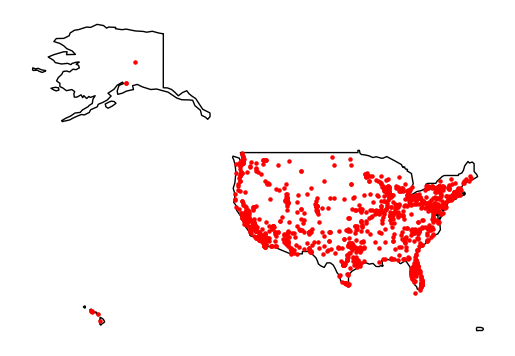

In [146]:
#state_map = gpd.read_file("States_shapefile.geojson")

base = state_map.plot(color='white', edgecolor='black')

ax = dennys_gpd.plot(ax=base, color='red', markersize=5);

ax.set_axis_off();

### Choropleth maps

In choropleth maps, predefined regions are filled in with colors based values of interest. 

Typically to create a choropleth map we join data of interest onto a map. 

Let's explrore this now...


In [147]:
import plotly.express as px

gapminder_2007 = px.data.gapminder().query("year == 2007")   # the plotly package comes with the gapminder data


# Join the gapminder data onto our world map

world2 = world.merge(gapminder_2007, left_on = "SOV_A3", right_on = "iso_alpha")
world2.head(3)

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_UA,geometry,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3...",Tanzania,Africa,2007,52.517,38139640,1107.482182,TZA,834
1,Admin-0 country,1,2,Canada,CAN,0,2,Sovereign country,1,Canada,...,None,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025...",Canada,Americas,2007,80.653,33390141,36319.235010,CAN,124
2,Admin-0 country,1,2,Indonesia,IDN,0,2,Sovereign country,1,Indonesia,...,None,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ...",Indonesia,Asia,2007,70.650,223547000,3540.651564,IDN,360


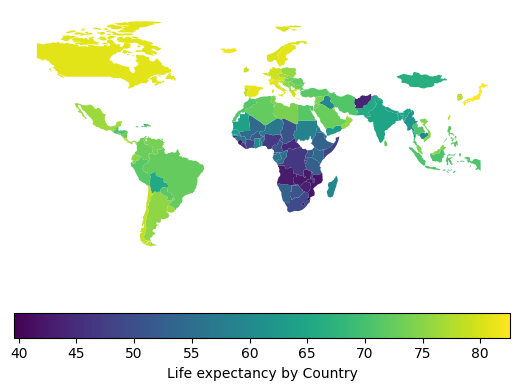

In [148]:
# Plot a choropleth map of life expectancy

ax = world2.plot(column='lifeExp', legend = True,
           legend_kwds={'label': "Life expectancy by Country",
                        'orientation': "horizontal"});

ax.set_axis_off();

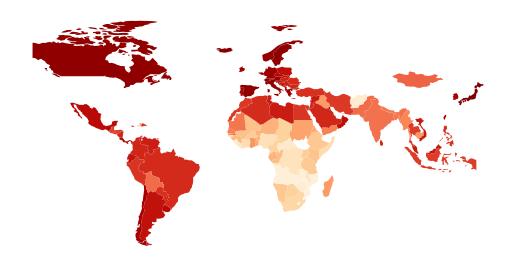

In [149]:
# Change the color scale

ax = world2.plot(column='lifeExp', cmap='OrRd');   # cmap='viridis')  

ax.set_axis_off();

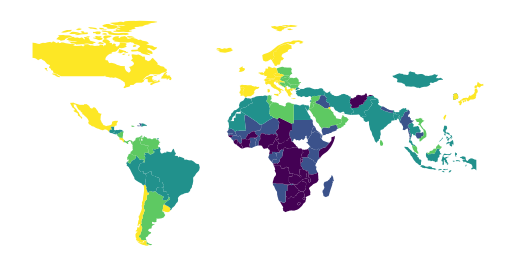

In [150]:
# We can plot quantiles

#world2.plot(column='lifeExp', cmap='OrRd', scheme='quantiles');

ax = world2.plot(column='lifeExp', cmap='viridis', scheme='quantiles');

ax.set_axis_off();

### Anorther choropleth map example

Let's fit a choropleth map examining which states in the USA are growing in terms of people having lots of childern. 

Any thoughts on which state this might be? 

To start, let's load a map with the outlines of the states in the USA, and load demographic data.

In [151]:
state_map = gpd.read_file("States_shapefile.geojson")

print(state_map.crs)

state_map.head(3)

EPSG:4326


,FID,Program,State_Code,State_Name,Flowing_St,FID_1,geometry
0,1,PERMIT TRACKING,AL,ALABAMA,F,919,"POLYGON ((-85.07007 31.9807, -85.11515 31.9074..."
1,2,,AK,ALASKA,N,920,"MULTIPOLYGON (((-161.33379 58.73325, -161.3824..."
2,3,AZURITE,AZ,ARIZONA,F,921,"POLYGON ((-114.52063 33.02771, -114.55909 33.0..."


In [152]:
# load demographic data on the states

state_demographics = pd.read_csv("state_demographics.csv")
state_demographics.head(3)

,State,under_5,over_64,bachelors_degree,total
0,Alabama,295811.997,741954.681,1095959.202,4849377
1,Alaska,54518.168,69252.808,202601.300,736732
2,Arizona,430814.976,1070305.956,1810769.196,6731484


In [153]:
# In order to join the DataFrames, we need to make sure the states have the same capitalization

state_demographics2 = state_demographics.copy()
state_demographics2["State"] = state_demographics["State"].apply(str.upper)

state_demographics2.head()

,State,under_5,over_64,bachelors_degree,total
0,ALABAMA,295811.997,741954.681,1.095959e+06,4849377
1,ALASKA,54518.168,69252.808,2.026013e+05,736732
2,ARIZONA,430814.976,1070305.956,1.810769e+06,6731484
3,ARKANSAS,192813.985,465719.933,5.962402e+05,2966369
4,CALIFORNIA,2522162.500,5005522.500,1.191237e+07,38802500


In [154]:
# Join the demographic information on to the the USA map

state_map_demo = state_map.merge(state_demographics2, 
                                 left_on = "State_Name", right_on = "State")
state_map_demo.head(3)

,FID,Program,State_Code,State_Name,Flowing_St,FID_1,geometry,State,under_5,over_64,bachelors_degree,total
0,1,PERMIT TRACKING,AL,ALABAMA,F,919,"POLYGON ((-85.07007 31.9807, -85.11515 31.9074...",ALABAMA,295811.997,741954.681,1095959.202,4849377
1,2,,AK,ALASKA,N,920,"MULTIPOLYGON (((-161.33379 58.73325, -161.3824...",ALASKA,54518.168,69252.808,202601.300,736732
2,3,AZURITE,AZ,ARIZONA,F,921,"POLYGON ((-114.52063 33.02771, -114.55909 33.0...",ARIZONA,430814.976,1070305.956,1810769.196,6731484


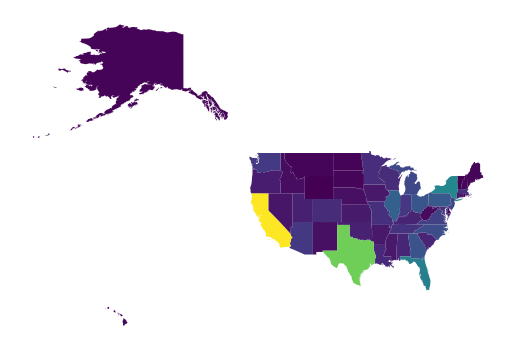

In [155]:
# Let's plot the map 

ax = state_map_demo.plot(column = "under_5", cmap='viridis');

ax.set_axis_off();

Is there anything [wrong with this map](https://xkcd.com/1138/)? 

In [156]:
# Let's look at the proportion of people under the age of 5

state_map_demo2 = state_map_demo.copy()

state_map_demo2["percent_under_5"] = 100 * state_map_demo["under_5"]/state_map_demo["total"]

state_map_demo2.head(3)


,FID,Program,State_Code,State_Name,Flowing_St,FID_1,geometry,State,under_5,over_64,bachelors_degree,total,percent_under_5
0,1,PERMIT TRACKING,AL,ALABAMA,F,919,"POLYGON ((-85.07007 31.9807, -85.11515 31.9074...",ALABAMA,295811.997,741954.681,1095959.202,4849377,6.1
1,2,,AK,ALASKA,N,920,"MULTIPOLYGON (((-161.33379 58.73325, -161.3824...",ALASKA,54518.168,69252.808,202601.300,736732,7.4
2,3,AZURITE,AZ,ARIZONA,F,921,"POLYGON ((-114.52063 33.02771, -114.55909 33.0...",ARIZONA,430814.976,1070305.956,1810769.196,6731484,6.4


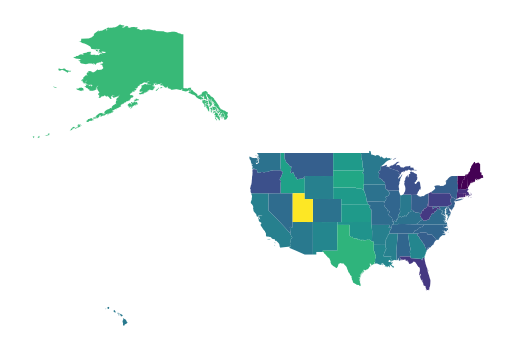

In [157]:
# Let's plot the new map

ax = state_map_demo2.plot(column = "percent_under_5", cmap='viridis');

ax.set_axis_off();

## 2. Creating interactive maps with plotly

We can also create interactive choropleth maps in plotly. Let's try it now!

For more examples of plotly maps [see](https://plotly.com/python/mapbox-county-choropleth/). There are also several other packages for creating maps, such as [geoplot](https://geopandas.org/en/stable/gallery/plotting_with_geoplot.html), [leaflet, and folium](https://www.earthdatascience.org/tutorials/introduction-to-leaflet-animated-maps/), so I encourage you to explore further if you are interested. 



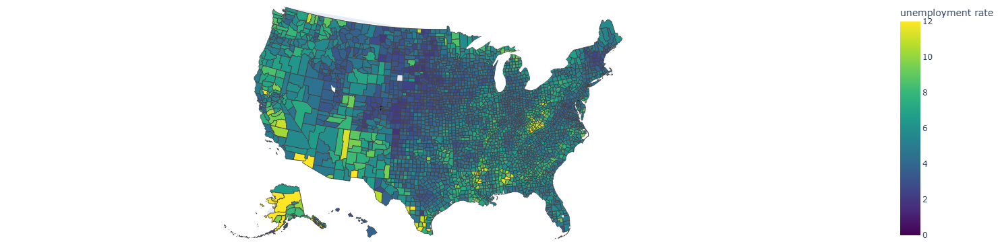

In [158]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
                   dtype={"fips": str})

import plotly.express as px

fig = px.choropleth(df, geojson=counties, locations='fips', color='unemp',
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           scope="usa",
                           labels={'unemp':'unemployment rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


## 3. Loops

Loops allow us to repeat a process many times. They are particularly useful in conjuction with lists to process and store multiple values. 


In [159]:
# Loop over items in a list
a_list = ["first", "second", "third", "forth"]


for item in a_list:
    print(item)


first
second
third
forth


In [160]:
# Loop over numbers using the range() function

for i in range(10):
    print(i)


0
1
2
3
4
5
6
7
8
9


In [161]:
# Can you print the squares of the numbers from 1 to 6? 

for i in range(1, 7): 
    print(i**2)

1
4
9
16
25
36


We can use a loop to build up values in a list...

In [162]:
# Create a list that has the squares of the numbers 1 to 6
# hint: the .append() method will be useful

my_squares = []

for i in range(1, 7):
    
    my_squares.append(i**2)


my_squares


[1, 4, 9, 16, 25, 36]

### Challenge question 1

Can you use loops to sum the numbers 1 to 10? 

Or, to use mathematical notation, can you compute $\sum_{i=1}^{10} i$ ?


In [163]:
# Sum numbers from 1 to 10
my_sum = 0

for i in range(1, 11):
    my_sum = my_sum + i

my_sum

55

### Enumerate

We can use enumerate(my_list) to get both values from a list and sequential index numbers.


In [164]:
# We can use enumerate(my_list) to get both values from a list 
# and sequential index numbers

a_list = ["first", "second", "third", "forth"]

for i, curr_val in enumerate(a_list):
    print(str(i) + " " + curr_val)


0 first
1 second
2 third
3 forth


### zip function

We can use `zip(list_1, list_2)` to get values from two lists in a for loop. 


In [165]:
list_1 = ["a", "b", "c"]
list_2 = ["x", "y", "z"]

for item1, item2 in zip(list_1, list_2):
    print(item1, item2)


a x
b y
c z


### Challenge question 2

The code below extracts two lists that have the the high and low temperatures from 2014 in NYC. 

Please use for loops to create a list that has the temperature range (high - low temperature) for each day (without using numpy).


In [166]:
import pandas as pd
import matplotlib.pyplot as plt

bikes = pd.read_csv("daily_bike_totals.csv", parse_dates = [0])
bikes_2014 = bikes.query("date > '2013-12-31'").query("date < '2015-01-01'")

max_temps = bikes_2014["max_temperature"].to_list()
min_temps = bikes_2014["min_temperature"].to_list()

print(max_temps[0:5])
print(min_temps[0:5])

[33.08, 33.08, 18.14, 29.12, 39.92]
[24.26, 18.14, 9.14, 8.24, 27.14]


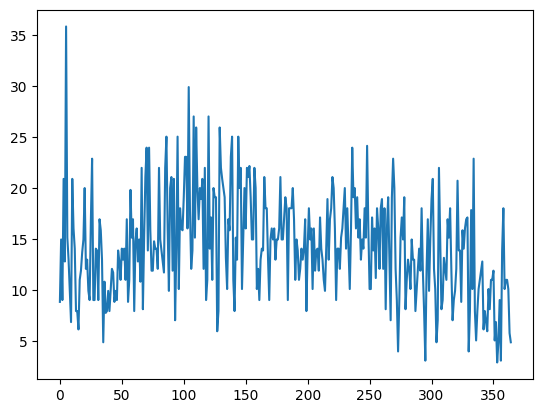

In [167]:
# Create a list called "temp_range" that has the temperature range for each day in 2014...

# Start with an empty list
temp_range = [];


# Use a for loop to add the temperature range for each day
for i in range(len(max_temps)):

    curr_max = max_temps[i]
    curr_min = min_temps[i]
    temp_range.append(curr_max - curr_min)



# Plot the range of temperatures
plt.plot(temp_range);


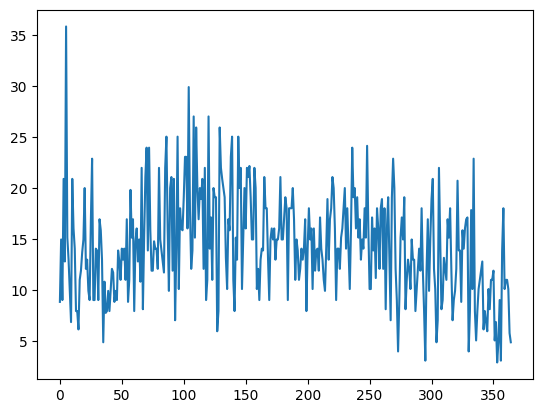

In [168]:
# Alternative solution using the zip function...

# Start with an empty list
temp_range2 = [];


# Use a for loop to add the temperature range for each day
for curr_max, curr_min in zip(max_temps, min_temps):

    temp_range2.append(curr_max - curr_min)



# Plot the range of temperatures
plt.plot(temp_range2);


In [169]:
# Can you do the same calculation using numpy arrays?  
# Which is easier? 
import numpy as np

temp_range_array = np.array(max_temps) - np.array(min_temps)


# checking they are the same
np.sum(temp_range_array == np.array(temp_range))


np.int64(365)

In [170]:
%%capture

# You can run this code to covert this Jupyter notebook into a pdf
!quarto render class_15_answers.ipynb --cache-refresh --to pdf 